# Book value growth and stock price growth

Charlie Munger once said that in the long run, stock price will track the book value. Let's see if this is true.

# A self-fulfilling prophecy

It's true that BRK's book value converge with price in the long run. But it's likely the only one. Other stocks vary to different degrees. One possibility is that shareholders of BRK are mostly value investors, therefore they care a lot about the tangible value.

# The V shape of P/B to price

Interestingly, many companies have a V shape between P/B and price. When the price is low, P/B decreses while price increase. That must be caused by book value increase at a higher speed. But later on, P/B will increase after price increased to a point. All those recognized companies has higher P/B when price becomes higher. Tangible book value – cash, PP&E, and inventories – is not the reason to by a stock. The value is intangible: the ability to make money out of assets, be it management that leverage labors, technology, brand, etc. Those are the intrincic value of business, not the tangible assets.

In [4]:
from fmp_data import Dataset, AFTER_PRICE

symbols = {'AAPL', 'MSFT', 'GOOGL', 'AMZN', 'TSLA', 'META', 'NFLX', 'DIS', 'UNH', 'NKE', 'LRN', 'BRK-A', 'NVDA', 'COKE'}

df = pd.DataFrame()
for sym in symbols:
    cur = Dataset(sym, ['book_value_per_share', AFTER_PRICE], {'book_value_per_share': 'book', AFTER_PRICE: 'price'})
    cur.data['symbol'] = sym
    df =pd.concat([df, cur.data])
df['pb'] = np.where(df['book'] > 0,  df['price']/ df['book'], np.nan)
df['date'] = pd.to_datetime(df['date'])

In [74]:
def plot(sym):
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(27, 10))
    t = df[df.symbol == sym].sort_values('date').copy()
    t['book_chg'] = t.book.pct_change(fill_method=None)
    t['price_chg'] = t.price.pct_change(fill_method=None)

    # book value and price over time
    ax1.plot(t.date, t.book, '.-', label=f'{sym} Book')
    axt = ax1.twinx()
    axt.plot(t.date, t.price, '.-', label=f'{sym} Price', color='seagreen')
    ax1.legend(loc='upper left')
    axt.legend(loc='upper right')

    # P/B over time
    pb_low, pb_high = t.pb.quantile([0.10, 0.90])
    tt = t[(t.pb > pb_low) & (t.pb < pb_high)]
    ax2.plot(tt.date, tt.pb, label=f'P/B ratio')
    ax2.legend(loc='upper left')

    # price change and book value change relationship
    book_change_low, book_change_high = t.book_chg.quantile([0.10, 0.90])
    price_change_low, price_change_high = t.price_chg.quantile([0.10, 0.90])
    tt = t[(t.book_chg > book_change_low) & (t.book_chg < book_change_high) & (t.price_chg > price_change_low) & (t.price_chg < price_change_high)]

    ax3.plot(tt.book_chg, tt.price_chg, 'o', label=f'{sym} Book vs Price')
    ax3.set_xlabel('Book value change')
    ax3.set_ylabel('Price change')
    ax3.legend(loc='upper left')

    # Price to book ratio over time
    ax4.plot(t.price, t.pb, 'o', label=f'P/B and Price')
    ax4.set_xlabel('Price')
    ax4.set_ylabel('P/B ratio')


    fig.suptitle(f'{sym}', size=20)
    
    plt.tight_layout()



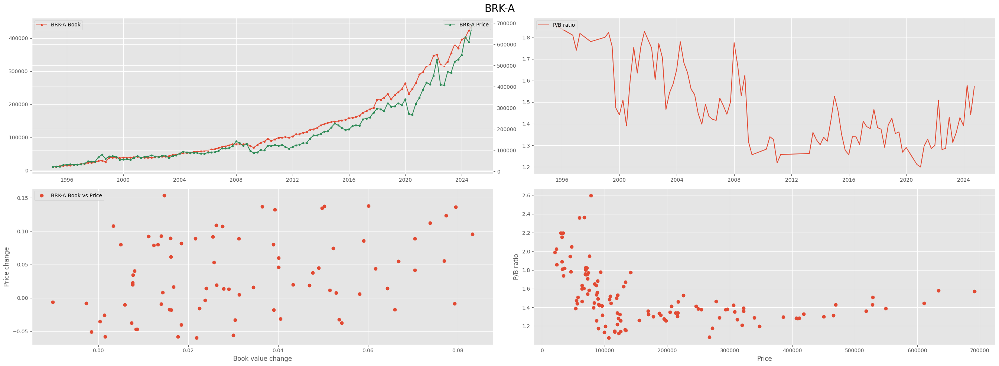

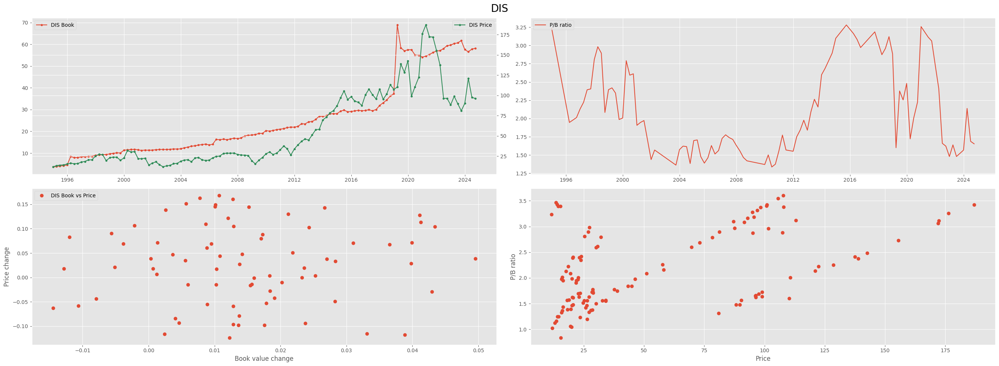

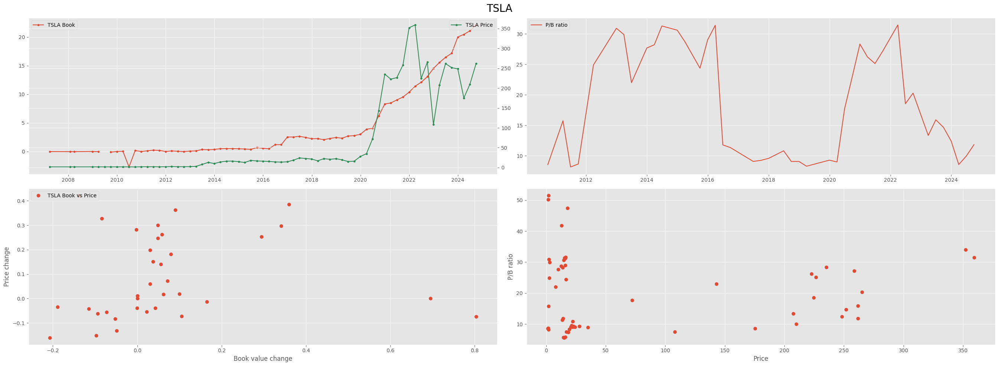

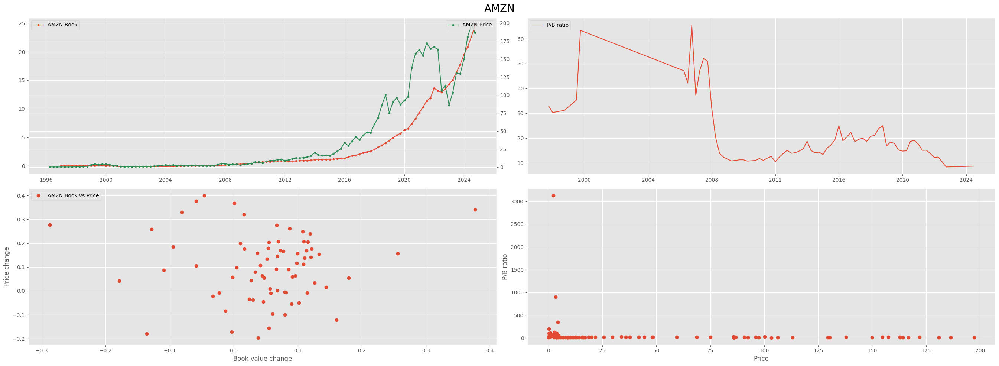

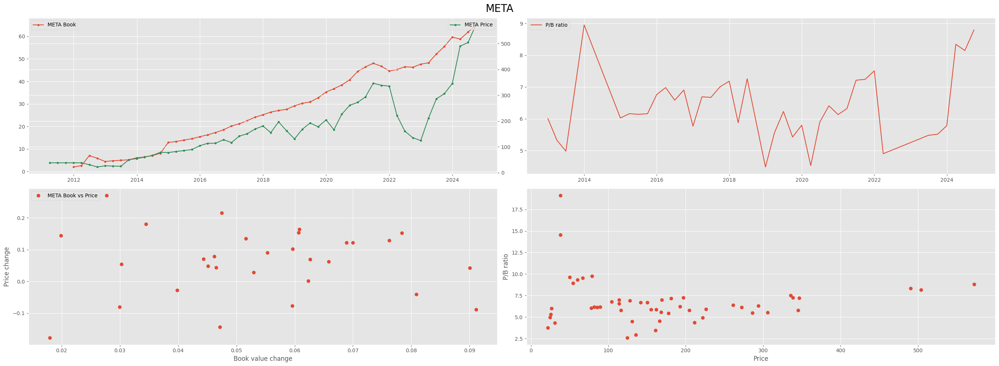

...

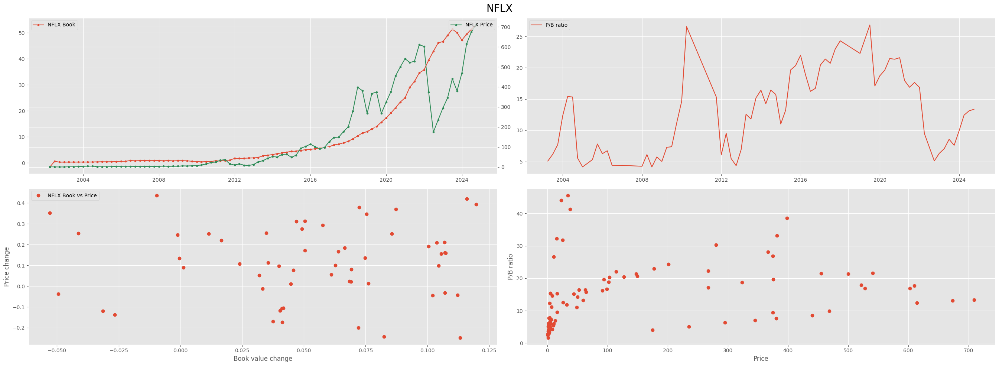

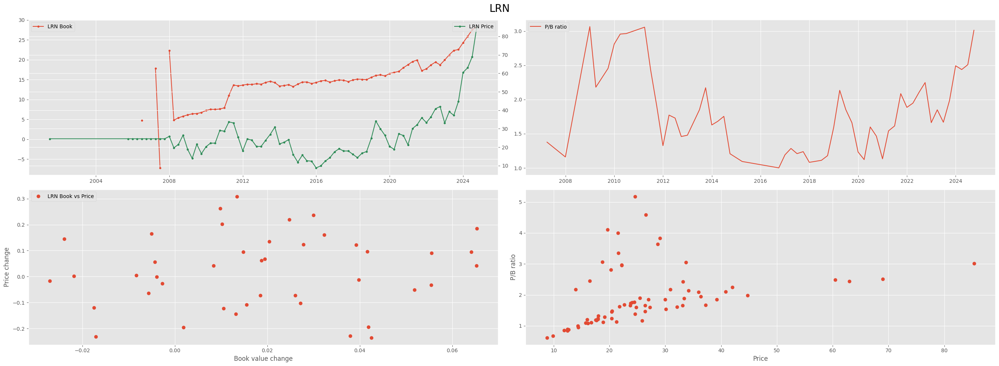

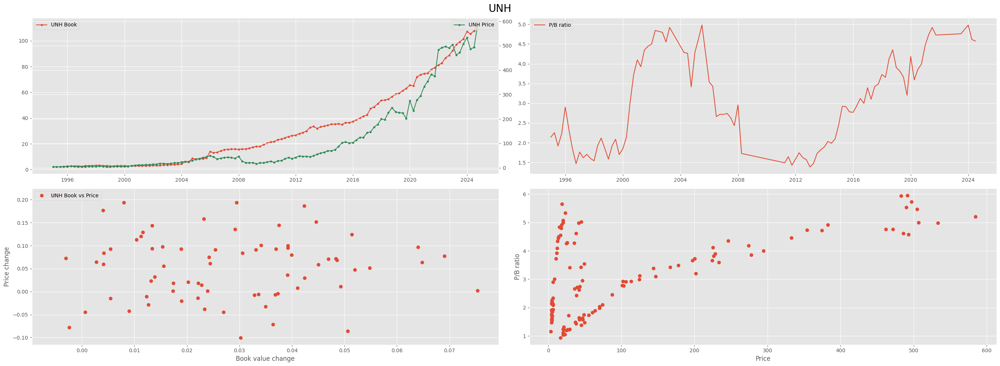

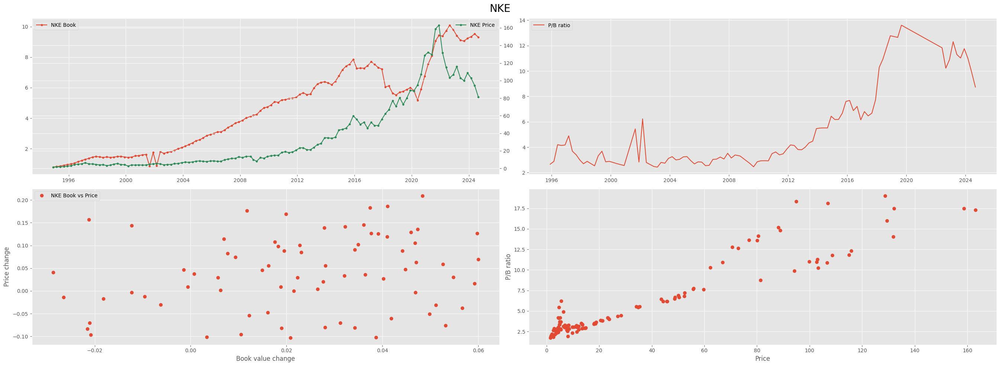

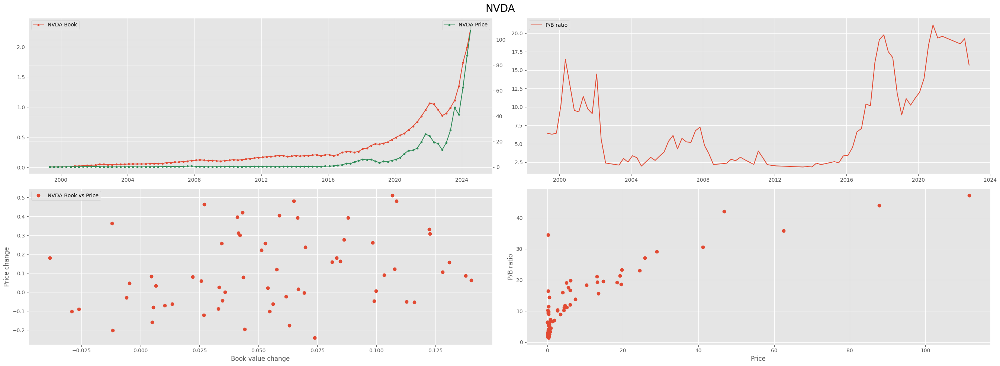

In [55]:
for sym in list(symbols):
    plot(sym)

/var/folders/jv/zpk9r3mn7dq5ghtk8zl52vt00000gn/T/ipykernel_54540/2363699379.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(27, 10))


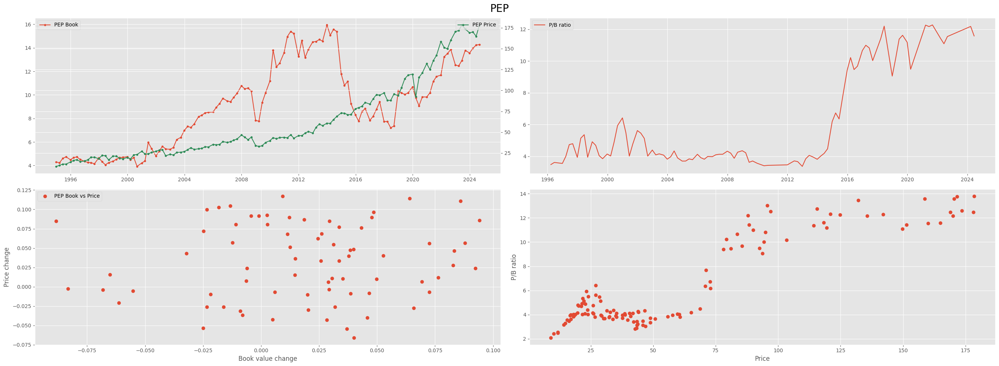

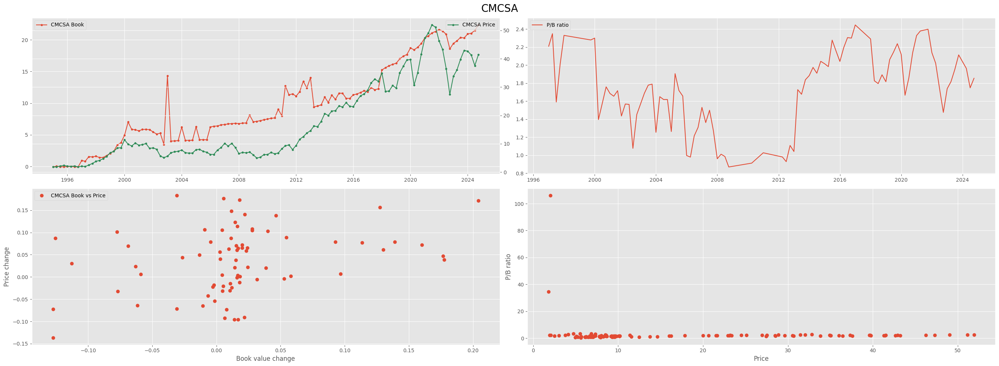

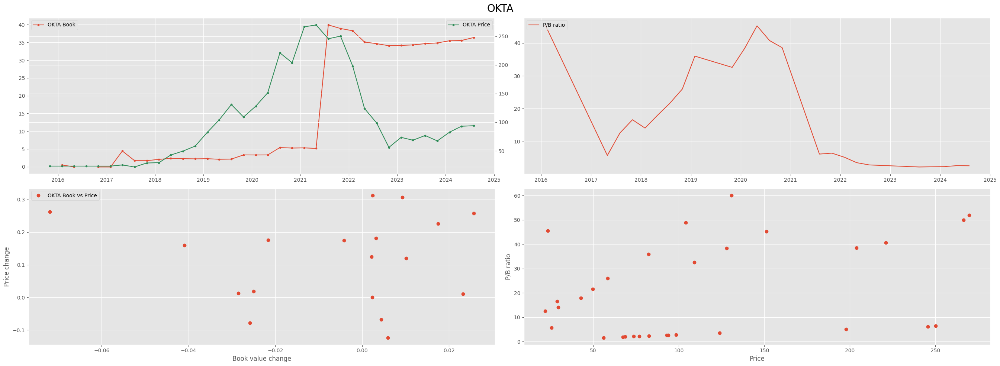

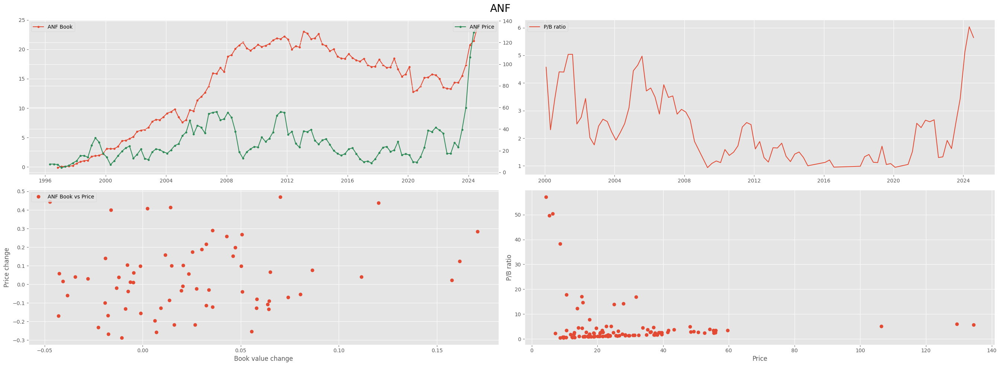

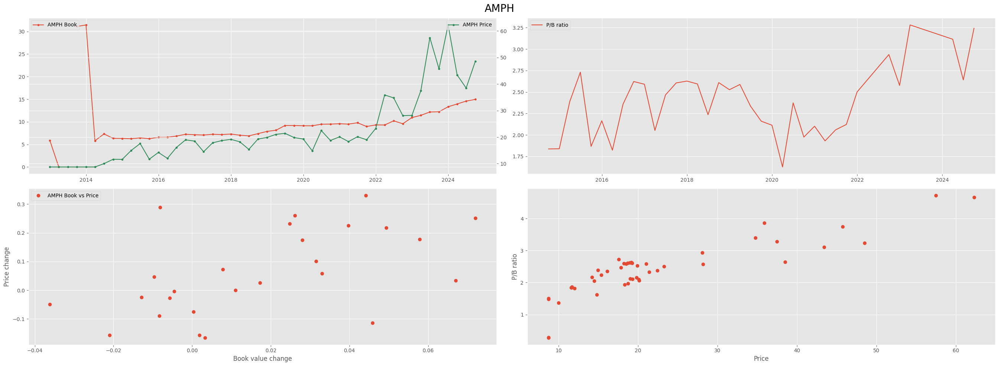

...

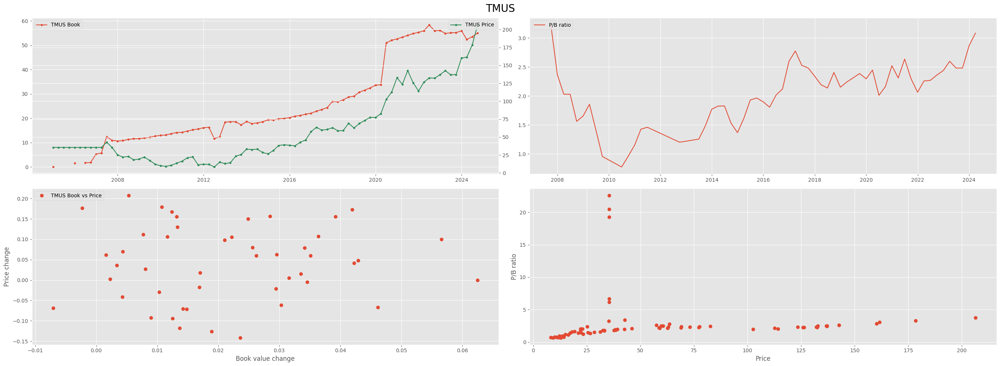

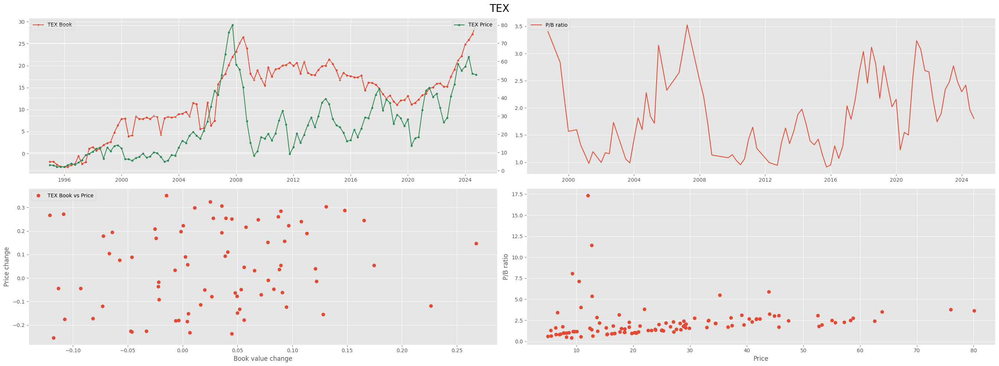

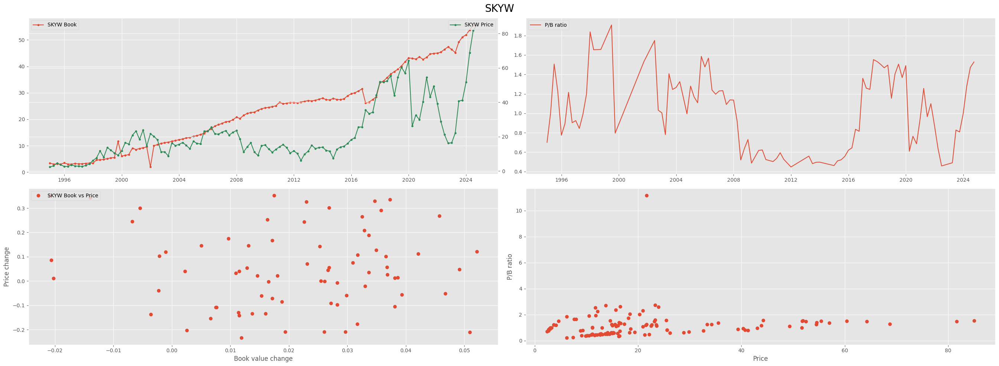

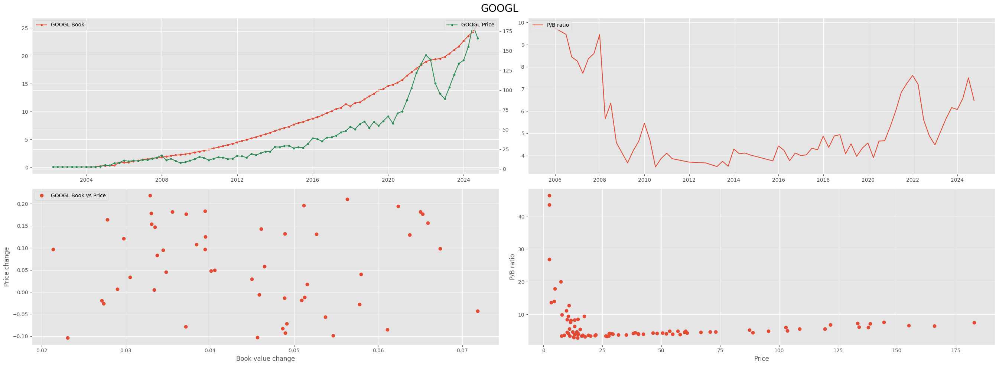

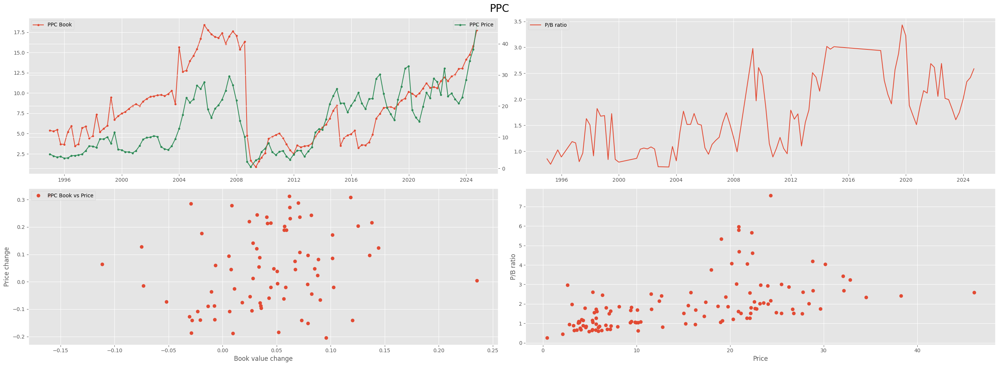

In [76]:

ap = {'CCL', 'SYF', 'EAT', 'SKYW', 'CLS', 'CLS', 'GM', 'TMUS', 'STRL', 'TWLO', 'PPC', 'MFC', 'UBER', 'BRK-A', 'ATGE', 'MHO', 'MHO', 'ANF', 'BLBD', 'CAAP', 'URI', 'AMPH', 'APP', 'AGX', 'GOOGL', 'SFM', 'CRM', 'RCL', 'CAH', 'CMCSA', 'POWL', 'POWL', 'OKTA', 'PEP', 'RGA', 'ZETA', 'MOD', 'MOD', 'GRBK', 'TEX'}
df = pd.DataFrame()
for sym in list(ap):
    cur = Dataset(sym, ['book_value_per_share', AFTER_PRICE], {'book_value_per_share': 'book', AFTER_PRICE: 'price'})
    cur.data['symbol'] = sym
    df =pd.concat([df, cur.data])
df['pb'] = np.where(df['book'] > 0,  df['price']/ df['book'], np.nan)
df['date'] = pd.to_datetime(df['date'])
for sym in ap:
    plot(sym)